## Insight for the medical dataset

### Imports

In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import collections
%matplotlib inline

### Paths

In [2]:
DATA_PATH = './data/medical/'
BINDINGDB = 'BindingDB_All.tsv'
ChEMBL = 'BindingDB_ChEMBL.tsv'

### Loading the data

In [3]:
def load_BindingDB(file):
    file_path = DATA_PATH + file

    ## load the first row to get the number of columns
    df_first_row = pd.read_csv(file_path, sep='\t', nrows=1)

    ## number of columns to use
    df = pd.read_csv(file_path, sep='\t', header=0, usecols=range(df_first_row.shape[1]))
    return df

In [4]:
df = load_BindingDB(BINDINGDB)

C:\Users\Charaf Kamel\AppData\Local\Temp\ipykernel_24316\2661906853.py:8: DtypeWarning: Columns (8,9,10,11,12,13,15,17,20,21,22,23,27,28,32,33,35,36,45,46,47,48,50,51,52,53,54,55,57,58,59,60,62,63,64,65,66,67,69,70,71,72,74,75,76,77,78,79,81,82,83,86,87,88,89,90,91,93,94,95,98,99,100,101,102,103,105,106,107,110,111,112,113,114,115,117,118,119,122,123,124,125,126,127,129,130,131,134,135,136,137,138,139,141,142,143,146,147,148,149,150,151,153,154,155,158,159,160,161,162,163,165,166,167,170,171,172,173,174,175,177,178,179,182,183,184,185,186,187,189,190,191) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path, sep='\t', header=0, usecols=range(df_first_row.shape[1]))


In [5]:
print(f"Number of rows: {len(df)}")
print(f"Number of cols: {len(df.columns)}")

Number of rows: 2913285
Number of cols: 194


In [6]:
df.head()

,BindingDB Reactant_set_id,Ligand SMILES,Ligand InChI,Ligand InChI Key,BindingDB MonomerID,BindingDB Ligand Name,Target Name,Target Source Organism According to Curator or DataSource,Ki (nM),IC50 (nM),...,UniProt (SwissProt) Recommended Name of Target Chain.12,UniProt (SwissProt) Entry Name of Target Chain.12,UniProt (SwissProt) Primary ID of Target Chain.12,UniProt (SwissProt) Secondary ID(s) of Target Chain.12,UniProt (SwissProt) Alternative ID(s) of Target Chain.12,UniProt (TrEMBL) Submitted Name of Target Chain.12,UniProt (TrEMBL) Entry Name of Target Chain.12,UniProt (TrEMBL) Primary ID of Target Chain.12,UniProt (TrEMBL) Secondary ID(s) of Target Chain.12,UniProt (TrEMBL) Alternative ID(s) of Target Chain.12
0,1,O[C@@H]1[C@@H](O)[C@@H](Cc2ccccc2)N(CCCCCC(O)=...,InChI=1S/C31H42N2O7/c34-27(35)17-9-3-11-19-32-...,XGEGDSLAQZJGCW-HHGOQMMWSA-N,608734,"6-[(4R,5S,6S,7R)-4,7-dibenzyl-3-(5-carboxypent...",Dimer of Gag-Pol polyprotein [501-599],Human immunodeficiency virus 1,0.24,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,O[C@@H]1[C@@H](O)[C@@H](Cc2ccccc2)N(C\C=C\c2cn...,InChI=1S/C31H34N6O3/c38-29-27(17-23-9-3-1-4-10...,UZLMEAPBHYEHAC-UNTBESQGSA-N,22,"(4R,5S,6S,7R)-4,7-dibenzyl-5,6-dihydroxy-1,3-b...",Dimer of Gag-Pol polyprotein [501-599],Human immunodeficiency virus 1,0.25,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,O[C@@H]1[C@@H](O)[C@@H](Cc2ccccc2)N(CC2CC2)C(=...,InChI=1S/C29H34N4O3/c34-27-25(16-21-8-3-1-4-9-...,HYNYUFZPPJMPOB-UTWJFGBXSA-N,23,"(4R,5S,6S,7R)-4,7-dibenzyl-1-(cyclopropylmethy...",Dimer of Gag-Pol polyprotein [501-599],Human immunodeficiency virus 1,0.41,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,OCCCCCCN1[C@H](Cc2ccccc2)[C@H](O)[C@@H](O)[C@@...,InChI=1S/C29H40N2O4/c32-18-10-2-1-9-17-30-25(1...,YXVAZXDWVZTGGD-VIJSPRBVSA-N,24,"(4R,5S,6S,7R)-4,7-dibenzyl-1-(cyclopropylmethy...",Dimer of Gag-Pol polyprotein [501-599],Human immunodeficiency virus 1,0.8,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,OCCCCCN1[C@H](Cc2ccccc2)[C@H](O)[C@@H](O)[C@@H...,InChI=1S/C28H38N2O4/c31-17-9-3-8-16-29-24(18-2...,WWTSWTPNILRSJX-XDZXDJIYSA-N,25,"(4R,5S,6S,7R)-4,7-dibenzyl-1-(cyclopropylmethy...",Dimer of Gag-Pol polyprotein [501-599],Human immunodeficiency virus 1,0.99,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
column_names = df.columns.tolist()

# Save to a text file
with open('column_names.txt', 'w') as f:
    for column in column_names:
        f.write(f"{column}\n")  # Write each column name on a new line

### Bar plots

#### NaN check by column

Text(0.5, 1.0, 'Histogram of NaN percentages for columns')

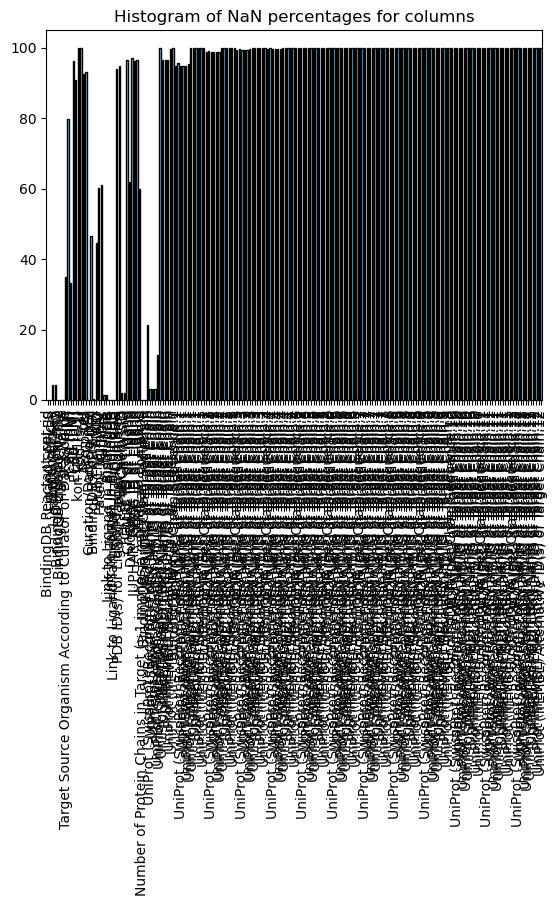

In [8]:
nan_counts_per_col = df.isna().mean(axis=0)*100
nan_counts_per_col.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title("Histogram of NaN percentages for columns")

In [ ]:
new_df = df.copy()
cols_to_drop = np.where(nan_counts_per_col >= 80)
new_df.drop(cols_to_drop)
new_df.head()

In [18]:
## WE have values in them like >1 or <21

In [79]:
import re
def keep_just_numeric(value):
    if type(value) != str:
        return 0
    
    cleaned_val = re.sub(r'[^\d.]+','', str(value)) ## There are random float / str in the dataset?? -> convert to str
    if(cleaned_val == ''): #It didn't contain any number?
        return 0
    return float(cleaned_val)
    

In [80]:
affinity_cols = ["Ki (nM)", "Kd (nM)"]
ec_ic = ["EC50 (nM)", "IC50 (nM)"] #### Measures of inhibitory (IC50) and effective concentrations (EC50)
bind_unbind = ["kon (M-1-s-1)", "koff (s-1)"] ## Rates of binding / unbinding of ligands

selected_cols = affinity_cols + ec_ic + bind_unbind
filtered_df = df[selected_cols]

for af_col in selected_cols:
    filtered_df[af_col] = filtered_df[af_col].apply(keep_just_numeric)
filtered_df.head()

C:\Users\Charaf Kamel\AppData\Local\Temp\ipykernel_24316\2774158246.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[af_col] = filtered_df[af_col].apply(keep_just_numeric)


,Ki (nM),Kd (nM),EC50 (nM),IC50 (nM),kon (M-1-s-1),koff (s-1)
0,0.24,0.0,0.0,0.0,0.0,0.0
1,0.25,0.0,0.0,0.0,0.0,0.0
2,0.41,0.0,0.0,0.0,0.0,0.0
3,0.80,0.0,0.0,0.0,0.0,0.0
4,0.99,0.0,0.0,0.0,0.0,0.0


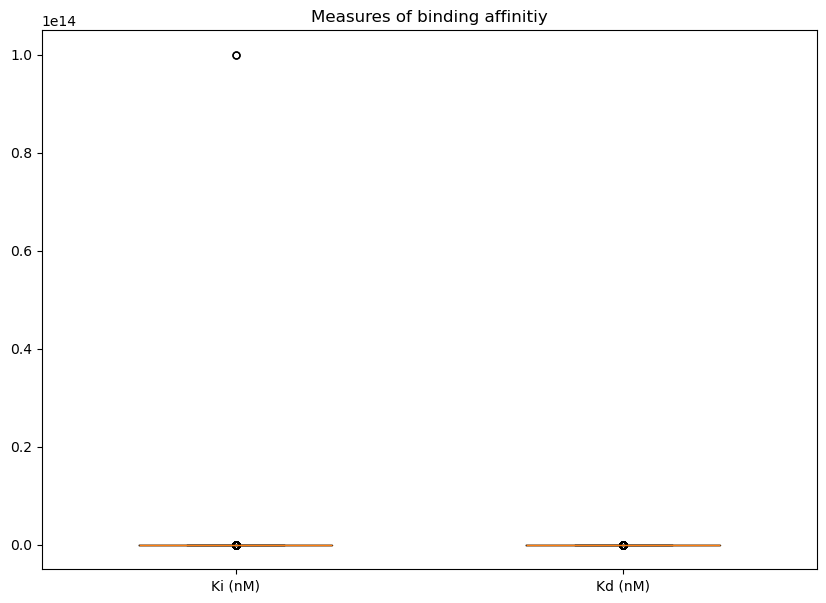

In [ ]:
filtered_df_aff = filtered_df[affinity_cols]
fig = plt.figure(figsize =(10, 7))
flierprops = dict(marker='o', color='red', markersize=5)
meanprops = dict(marker='o', color='orange', markersize=12, markeredgecolor='orange', markeredgewidth=10)  # Customize mean appearance

for i, af_col in enumerate(affinity_cols):
    plt.boxplot(filtered_df_aff[af_col], positions=[i], widths=0.5, flierprops=flierprops, meanprops=meanprops)
plt.title("Measures of binding affinitiy")
plt.xticks(range(len(affinity_cols)), affinity_cols)
#plt.ylim([-0.3, 1000])
#plt.yscale('log')
plt.show()



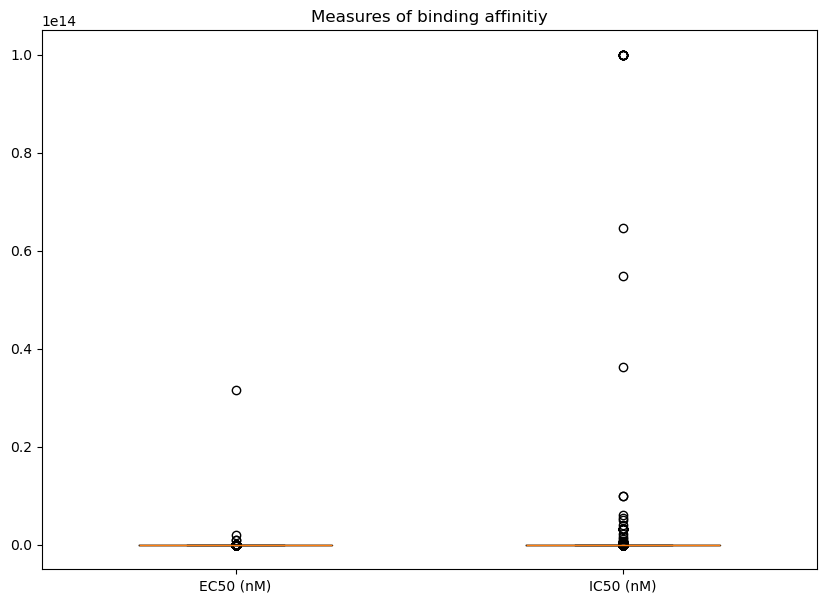

In [127]:
filtered_df_ec_ic = filtered_df[ec_ic]
fig = plt.figure(figsize =(10, 7))
flierprops = dict(marker='o', color='red', markersize=5)
meanprops = dict(marker='o', color='orange', markersize=8) 

for i, af_col in enumerate(ec_ic):
    plt.boxplot(filtered_df_ec_ic[af_col], positions=[i], widths=0.5)
plt.title("Measures of binding affinitiy")
plt.xticks(range(len(ec_ic)), ec_ic)
#plt.yticks(np.arange(-100, 100, step=10))
#plt.yscale('log')
plt.show()



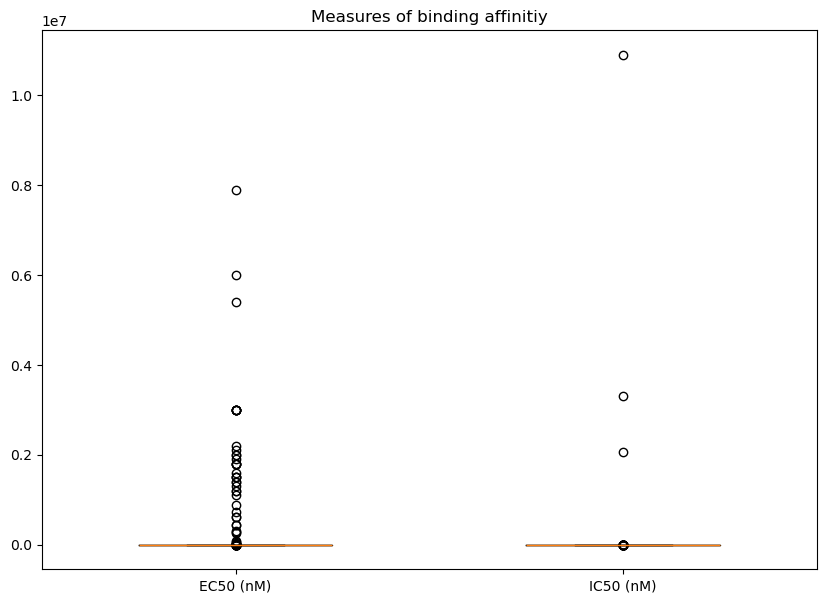

In [126]:
filtered_df_bind_unbind = filtered_df[bind_unbind]
fig = plt.figure(figsize =(10, 7))
flierprops = dict(marker='o', color='red', markersize=5)
meanprops = dict(marker='o', color='orange', markersize=8) 

for i, af_col in enumerate(bind_unbind):
    plt.boxplot(filtered_df_bind_unbind[af_col], positions=[i], widths=0.5)
plt.title("Measures of binding affinitiy")
plt.xticks(range(len(ec_ic)), ec_ic)
#plt.yticks(np.arange(-100, 100, step=10))
#plt.yscale('log')
plt.show()



#### Temp distribution

(array([ 0.,  2.,  4.,  6.,  8., 10., 12.]),
 [Text(0.0, 0, '0'),
  Text(2.0, 0, '2'),
  Text(4.0, 0, '4'),
  Text(6.0, 0, '6'),
  Text(8.0, 0, '8'),
  Text(10.0, 0, '10'),
  Text(12.0, 0, '12')])

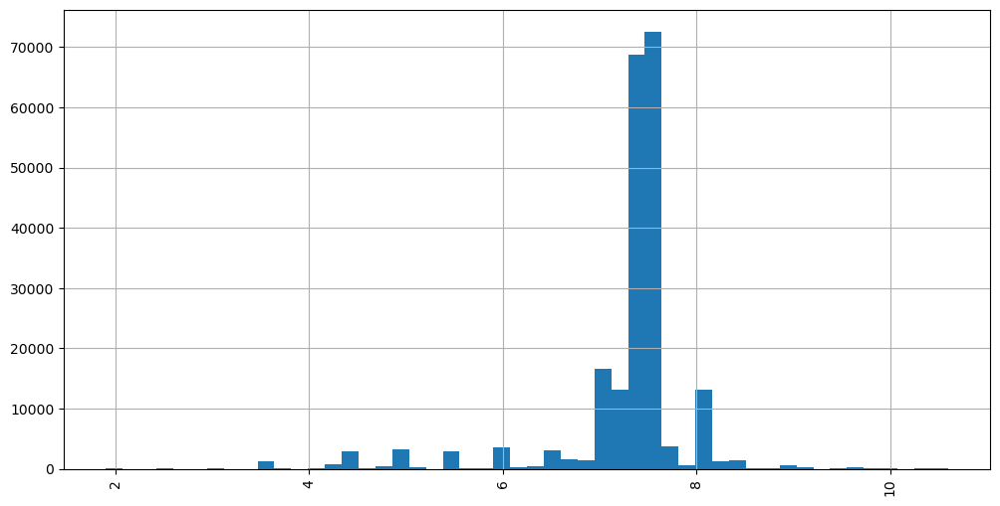

In [21]:
plt.figure(figsize=(12, 6)) 
df['pH'].hist(bins = 50)
plt.xticks(rotation=90)

In [36]:
type(list(df['Temp (C)'])[10000])

a = [b for b in a if isinstance(b, float)]

float

In [30]:
for temp in list(set(df['Temp (C)'])):
    if("nan"):
        print(temp)

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


KeyboardInterrupt: 

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57],
 [Text(0, 0, '37.00 C'),
  Text(1, 0, '25.00 C'),
  Text(2, 0, '30.00 C'),
  Text(3, 0, '22.00 C'),
  Text(4, 0, '4.00 C'),
  Text(5, 0, '28.00 C'),
  Text(6, 0, '23.00 C'),
  Text(7, 0, '20.00 C'),
  Text(8, 0, '21.00 C'),
  Text(9, 0, '35.00 C'),
  Text(10, 0, '38.00 C'),
  Text(11, 0, '27.00 C'),
  Text(12, 0, '24.00 C'),
  Text(13, 0, '40.00 C'),
  Text(14, 0, '32.00 C'),
  Text(15, 0, '0.00 C'),
  Text(16, 0, '55.00 C'),
  Text(17, 0, '26.00 C'),
  Text(18, 0, '36.00 C'),
  Text(19, 0, '22.50 C'),
  Text(20, 0, '15.00 C'),
  Text(21, 0, '34.00 C'),
  Text(22, 0, '10.00 C'),
  Text(23, 0, '16.00 C'),
  Text(24, 0, '7.70 C'),
  Text(25, 0, '2.70 C'),

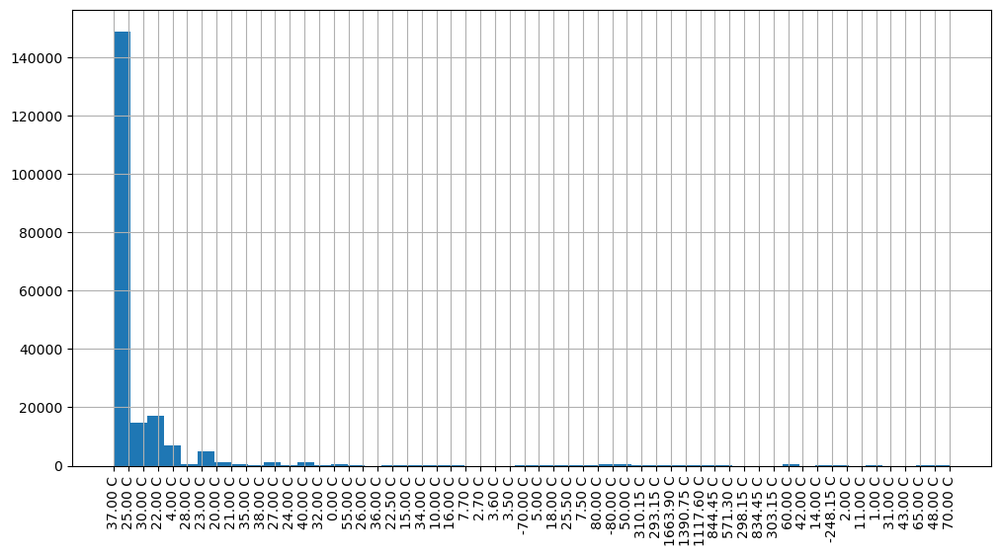

In [20]:
plt.figure(figsize=(12, 6)) 
df['Temp (C)'].hist(bins = 50)
plt.xticks(rotation=90)

In [10]:
df[df['Target Source Organism According to Curator or DataSource'] == "Rattus norvegicus"].head()

,BindingDB Reactant_set_id,Ligand SMILES,Ligand InChI,Ligand InChI Key,BindingDB MonomerID,BindingDB Ligand Name,Target Name,Target Source Organism According to Curator or DataSource,Ki (nM),IC50 (nM),...,UniProt (SwissProt) Recommended Name of Target Chain.12,UniProt (SwissProt) Entry Name of Target Chain.12,UniProt (SwissProt) Primary ID of Target Chain.12,UniProt (SwissProt) Secondary ID(s) of Target Chain.12,UniProt (SwissProt) Alternative ID(s) of Target Chain.12,UniProt (TrEMBL) Submitted Name of Target Chain.12,UniProt (TrEMBL) Entry Name of Target Chain.12,UniProt (TrEMBL) Primary ID of Target Chain.12,UniProt (TrEMBL) Secondary ID(s) of Target Chain.12,UniProt (TrEMBL) Alternative ID(s) of Target Chain.12
1899,1899,C[C@@H]1CC[C@H](CN1C(=O)c1ccc(F)cc1-n1nccn1)Oc...,InChI=1S/C21H19FN6O2/c1-14-2-4-17(30-20-10-15(...,XADMHFYHZAIOGX-RHSMWYFYSA-N,97377,"Orexin receptor antagonist 8::US20130102619, 8",Orexin/Hypocretin receptor type 1,Rattus norvegicus,NaN,>10000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1963,1963,Fc1ccc(cc1)C1(CC1)C(=O)N1CC2CC2(C1)c1c[nH]c2nc...,InChI=1S/C22H20FN3O/c23-16-5-3-14(4-6-16)21(7-...,NVEWYSISVYQERO-UHFFFAOYSA-N,50390707,"CHEMBL2070316::US8486964, 1",11-beta-hydroxysteroid dehydrogenase 1,Rattus norvegicus,NaN,930,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3130,3130,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n1c3ccccc3...,InChI=1S/C28H26N4O3/c1-28-26(34-3)17(29-2)12-2...,HKSZLNNOFSGOKW-FYTWVXJKSA-N,2579,"(2S,3R,4R,6R)-3-methoxy-2-methyl-4-(methylamin...",Protein kinase C beta type,Rattus norvegicus,NaN,9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3131,3131,COC(=O)[C@]1(O)C[C@@H]2O[C@@]1(C)n1c3ccccc3c3c...,"InChI=1S/C27H21N3O5/c1-26-27(33,25(32)34-2)11-...",KOZFSFOOLUUIGY-CYBHFKQVSA-N,2580,"K252a::methyl (15R,16S,18S)-16-hydroxy-15-meth...",Protein kinase C beta type,Rattus norvegicus,NaN,470,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3132,3132,O=C1NCc2c1c1c3ccccc3[nH]c1c1[nH]c3ccccc3c21,InChI=1S/C20H13N3O/c24-20-17-12(9-21-20)15-10-...,MEXUTNIFSHFQRG-UHFFFAOYSA-N,2581,"3,13,23-triazahexacyclo[14.7.0.0^{2,10}.0^{4,9...",Protein kinase C beta type,Rattus norvegicus,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
